# Data science experiments
## Twitter analysis
### Trying the following
    - Select football related tweets from 2 million tweets with only one seed word "football"
    - Using deep neural networks for the task
    - Can we visualize tweets?
    - Will clustering help to categorize tweets (unsupervised learning)

Importing required modules

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import keras
import nltk
import gensim
from gensim.models import word2vec
import sys
import joblib
import gc
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pickle
import sklearn
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale, normalize
from IPython.display import IFrame, HTML, Image

Using TensorFlow backend.


In [2]:
# Setting the defaults
%matplotlib inline
W2V_LOAD_FROM_FILE =True
WORD_ARRAY_LOAD_FROM_FILE =True
VERBOSE = 10
sns.set()
#plt.rcParams['figure.figsize'] = (12,8)

In [3]:
# ? custom log function for debugging
def log(msg, level = 0):
    if VERBOSE>0:
        print(msg)
        # print('\a')

## Preparing the data, preprocessing/ loading the saved models

Original data is obtained from the following dataset

Tweets Blogs News - Swiftkey Dataset 4million

https://www.kaggle.com/crmercado/tweets-blogs-news-swiftkey-dataset-4million/metadata

In [4]:
# Loading the twitter text
if WORD_ARRAY_LOAD_FROM_FILE:
    log("Loading the already tokenized words from file")
    with open('words.pkl','rb')as f:words = pickle.load(f)
else:
    log("Opening the raw tet file")
    with open('data/texts/final/en_US/en_US.twitter.txt', 'r') as f:
        txt = f.read()
    sen = nltk.sent_tokenize(txt)
    words = [nltk.word_tokenize(x) for x in sen]
    log("saving the tokenized words")
    with open('words.pkl','wb')as f:pickle.dump(words,f)

# Loading/ preparing the word2vector model
if W2V_LOAD_FROM_FILE:
    log("Loading the already trained w2v model from file")
    with open('wv_model.pkl','rb') as f: wv_model = pickle.load(f)
else:
    log("Creating the w2v model from tokens")
    wv_model = word2vec.Word2Vec(words,min_count=1)
    if True:
        log("Saving the trained w2v model to file")
        with open('wv_model.pkl', 'wb') as f:
            pickle.dump(wv_model,f)


Loading the already tokenized words from file
Loading the already trained w2v model from file


In [5]:
log("creating a data frame")
df = pd.DataFrame({'words':words})

creating a data frame


In [6]:
# Doing some preprocessing
def do_stuff_1(df):
    log("calculating the word length per row")
    df['wordlen'] = [len(x) for x in df['words']]
    log("calculating the bag of words vector total for each row")
    wt=[]
    for row in df['words']:
        wt.append(np.sum([wv_model.wv[word] for word in row],axis = 0))
    try:
        df['wv_total']  =wt
        df = df.reset_index()
    except:
        raise
    return df
log("Taking a sample of 10000000 rows for the time being")
df_sample = df.sample(110000)
df_sample = do_stuff_1(df_sample)


Taking a sample of 10000000 rows for the time being
calculating the word length per row
calculating the bag of words vector total for each row


Some visualization
max wordlength in the sample is 124


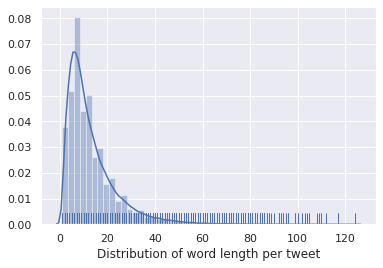

In [7]:
log("Some visualization")
sns.distplot(df_sample['wordlen'], rug  =True,axlabel="Distribution of word length per tweet")
print(f'max wordlength in the sample is {np.max(df_sample["wordlen"])}')

##  Trying to visualise the total word vector (bag of words) per tweet

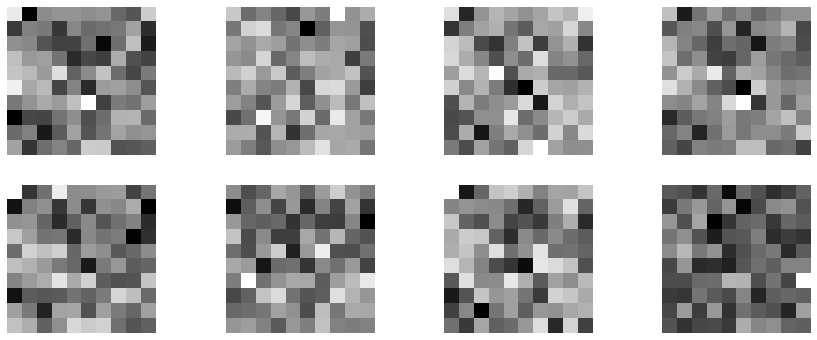

In [8]:
def temp(n):
    x = df_sample['wv_total'][n]
    x = np.repeat(x,3)
    x = (x - np.min(x)) /( np.max(x)-np.min(x) )
    x = np.reshape(x,(10,10,3))
    return [x,' '.join(df_sample['words'][n])]

fig, axs = plt.subplots(2,4,figsize=(15,6))
k=0
for i in range(0,2):
    for j in range (0,4):
        res = temp(k)
        axs[i,j].imshow(res[0])
        plt.imshow(res[0])
        # plt.suptitle(res[1])
        axs[i,j].set_axis_off()
        k+=1
        


### Explaination for the above figure
    - Each word of each tweet had been converted to a word embedding of 100 dimensions
    - Vector representation of each words have been added to give a single vector of 100 values (bag of words approach]
    - The same has been represented as an image of dimensio 10 X 10 pixels. 
    - Brightness of each pixel may be viewed as the sum value of all words in the tweet in a particular context.
    TODO:
    - Can we see patterns here? Do visible patterns make sense?
    - Could this be processed as an image?

### Trying clustering
    - Can I try K-means clustering based on the word vectors and try to make 5 clusters?
    - This did not work well as the data is too diverse to be grouped into 5 clusters.


In [9]:
%time
km = KMeans(n_clusters = 5, verbose =None, max_iter = 4000)
x = np.array(df_sample['wv_total'])
x = np.array([np.array(x) for x in x])
clust = km.fit_predict(x)
df_sample['clust']= clust
df_sample.loc[df_sample['clust']==3].iloc[10:20]  

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.05 µs


,index,words,wordlen,wv_total,clust
29,425083,"[They, DID, answer, you, a, few, minutes, ago, .]",9,"[12.496157, -24.58469, 0.025160275, 8.339509, ...",3
32,835880,"[Going, to, be, a, good, one, dang, next, time...",10,"[14.200767, -16.22411, 6.139949, 17.707191, -1...",3
35,1952210,"[I, wont, be, 21, until, late, May, PIERRE, is...",13,"[9.070113, -22.738022, 5.7507906, 7.140608, -3...",3
42,1501837,"[Albert, Camus, I, kno, ive, said, this, a, mi...",17,"[21.732126, -21.798239, 7.404582, 12.786538, -...",3
49,1567131,"[“, :, boys, with, long, eyelashes, are, so, c...",17,"[9.790852, -22.690018, -4.550118, 10.34954, -0...",3
57,1737012,"[Unfortunately, ,, those, people, are, all, Ch...",8,"[8.545171, -13.509114, -5.1571074, 8.223853, -...",3
59,395957,"[where, they, do, that, at, lol, SAVASANA, is,...",13,"[23.397593, -17.580954, -0.4957422, 10.18682, ...",3
64,1804319,"[Milwaukee, ..., it, 's, time, again, for, PLA...",10,"[6.0010333, -14.693511, 6.0636425, 6.831872, 2...",3
68,1653515,"[You, got, a, problem, with, that, .]",7,"[10.965938, -13.138326, -6.481737, 11.937269, ...",3
77,1115155,"[Shes, really, upset, just, now, and, it, woul...",14,"[33.26462, -20.829025, 2.9630451, 10.50483, 2....",3


## Trying to classify few tweets manually and then let the model take over


### Searching for the word 'dosa' hoping to find tweets relating to food
### findings:
    - Data is highly imbalanced.  there are only about 149 tweets with the word 'football' out of 100,000 tweets
    - Undersampling the data not seeming to relate to football to balance the training dataset.

In [10]:
# %%time
searchitems = ['football']
i = [ (lambda wrds: any([wrd in searchitems for wrd in wrds]))(lin) for lin in df_sample['words']]
df_sample['football'] = 0
df_sample.loc[np.array(i),'football']=1
len(df_sample.loc[df_sample['football']==1])


149

In [11]:
# Preparing the training data
temp1 = df_sample.loc[df_sample['football']==1]
temp2 = df_sample.loc[df_sample['football']==0].sample(300)
df_train = temp1.append(temp2)

In [13]:
from keras.models import Sequential
from keras.layers import Dense, Embedding, Dropout, Flatten
model = Sequential()
model.add(Dense(500,activation='relu', input_shape=(100,)))
model.add(Dropout(.4))
model.add(Dense(300, activation='relu'))
model.add(Dropout(.4))
model.add(Dense(2,activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

### Following is the configuration of the deep learning model

In [15]:
from keras.utils import print_summary
print_summary(model)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 500)               50500     
_________________________________________________________________
dropout_1 (Dropout)          (None, 500)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 300)               150300    
_________________________________________________________________
dropout_2 (Dropout)          (None, 300)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 602       
Total params: 201,402
Trainable params: 201,402
Non-trainable params: 0
_________________________________________________________________


In [16]:
train_x = df_train.loc[:,'wv_total']
train_x = np.array([np.array(x) for x in df_train.loc[:,'wv_total']])
train_x.shape
train_y = keras.utils.to_categorical(df_train.loc[:,'football'])
train_y.shape
h = model.fit(train_x, train_y, epochs=100,  validation_split = .2, verbose = 0)

# model.fit?

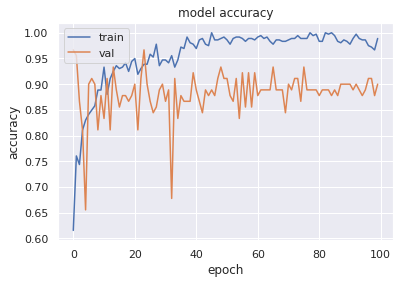

In [123]:
plt.plot(h.history['accuracy'])
plt.plot(h.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

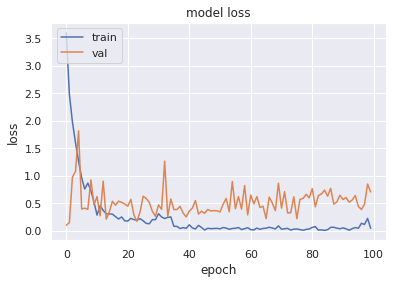

In [124]:
plt.plot(h.history['loss'])
plt.plot(h.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [125]:
df_test = do_stuff_1( df.sample(100000))
df_test

test_x = np.array([np.array(x) for x in df_test.loc[:,'wv_total']])
test_x.shape

pred = model.predict(test_x)
pred = np.round(pred)

df_test['pred_football'] = np.argmax(pred,1)

# df_sample['words'][10]

calculating the word length per row
calculating the bag of words vector total for each row


### Following are the tweets predicted by the model as relating to 'football' (showing 100)
#### Notes:
    - The results are hopefully related to footbal of at least other sports and events and relating to the players
    - There is no labled data available to calculate the predicted data. can be checked manually for the time being.
    - I think further techniques can be used like named entity recognition to tu furter vaidate the results and re train the model on the improved results.

In [126]:
temp = df_test.loc[df_test['pred_football']==1,'words']
temp = [' '.join(x).strip() for x in temp]
css = '<style>.left_aligned_df td { text-align: left; }</style>'
HTML(css + pd.DataFrame({'tweet':temp[100:200]}).to_html(classes='left_aligned_df'))


,tweet
0,Now Listening to The World by been a while since I heard this one ... < 3 I want that big eighh eighhh Thanks for helping .
1,researching SBA loans ( commercial property loans ) - wondering if any commercial lenders are on twitter that can advise ?
2,So do n't act all tough .
3,"This is our weekend , thanks for the # ff ."
4,did they have a game after you ?
5,Got ta watch out for the quiet ones : ) EXPERIENCED Retail Professional seeking District Manager position or higher ... www.filmproces0130.moonfruit.com I gotchu .
6,"Getting up this early is for the birds ... Whohoo , ca n't wait for the mini-food tour with next week !"
7,the # Mariners finally have it in em to win one i see in person .
8,"Well , some nights , I wish that this all would end 'cause I could use some friends for a change ."
9,"GA lol I should probably get my Civil Law book out of my gym locker ... . Guys and gals one more place to network in a clean enviroment www.spiritflowtv.com : ) RT : great meeting , & at # dh2012 see more of u tonight at cocktail party !"
